In [1]:
import sys
sys.path.append("/home/idumeur/code")
sys.path.append("/home/idumeur/code/sent2_cloud_remover/")

In [2]:
import utils.display_image as d
from utils.load_dataset import load_data
from utils.display_image import one_band_hist,plot_one_band,display_final_tile
import matplotlib.pyplot as plt
from utils.image_find_tbx import find_image_indir
import numpy as np

In [3]:
PATH="/srv/osirim/idumeur/data/dataset6/prepro1/input_large_dataset/train/"
NB_BAND_X=8
NB_BAND_LABEL=4
PATH_DIR=PATH+"dataX/"
PATH_TRAININGS="/srv/osirim/idumeur/trainings/"
NAME_MODEL="new_model"
TRAINING_NBER="13" #Check 5 or 1
PATH_THIS_MODEL=PATH_TRAININGS+NAME_MODEL+"/"
PATH_THIS_TRAINING="{}{}/training_{}/".format(PATH_TRAININGS,NAME_MODEL,TRAINING_NBER)
PATH_CHECKPOINT="{}checkpoints/".format(PATH_THIS_TRAINING)
PATH_SAVED_IM="{}saved_training_images/".format(PATH_THIS_TRAINING)
DICT_GROUP_BAND_LABEL={"R,G,B":[0,1,2],"NIR":[3]}
DICT_GROUP_BAND_X={"VV":[0,2],"VH":[1,3],"R,G,B":[4,5,6],"NIR":[7]}
S2_BANDS=['R,G,B', 'NIR']
S1_BANDS=['VV', 'VH']
FACT_STD_S2=1/7
FACT_STD_S1=1/5
DICT_RESCALE_TYPE={"VV": "StandardScaler", "VH":"StandardScaler","R,G,B":"StandardScaler","NIR":"StandardScaler"}

In [5]:
#load the raw data
data_X,data_y,l_dict=load_data(PATH, x_shape=(256,256,NB_BAND_X), label_shape=(256,256,NB_BAND_LABEL), normalization=False,dict_band_X=None,dict_band_label=None,dict_rescale_type=None,lim=10)

In [6]:
#load the rescaled_data
data_X_r,data_y_r,l_dict_r=load_data(PATH, x_shape=(256,256,NB_BAND_X), label_shape=(256,256,NB_BAND_LABEL), normalization=True,dict_band_X=DICT_GROUP_BAND_X,dict_band_label=DICT_GROUP_BAND_LABEL,dict_rescale_type=DICT_RESCALE_TYPE,s2_bands=S2_BANDS, s1_bands=S1_BANDS,fact_s1=1/5, fact_s2=1/7,clip_s2=True,lim=10)

Remove the negative values in order to have no error in the log : negative value will be replaced usingknn algorithm
Important the index of the bands in lband_index should be index that follow each other
No scaler was defined before
Remove the negative values in order to have no error in the log : negative value will be replaced usingknn algorithm
Important the index of the bands in lband_index should be index that follow each other
No scaler was defined before
No scaler was defined before
No scaler was defined before


(256, 256, 8)
(256, 256, 8)
(256, 256, 4)
(256, 256, 4)


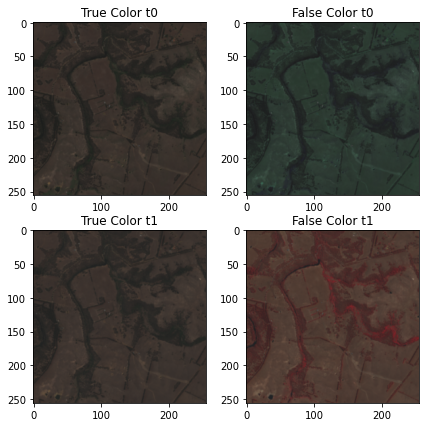

(256, 256, 8)
(256, 256, 8)
(256, 256, 4)
(256, 256, 4)


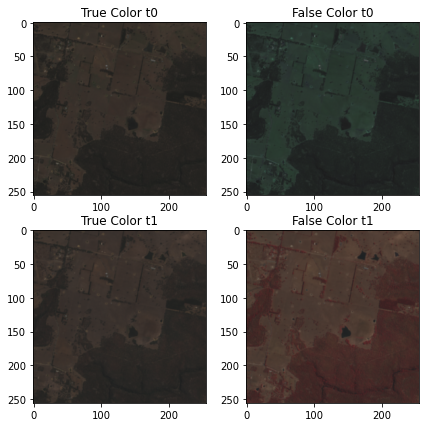

(256, 256, 8)
(256, 256, 8)
(256, 256, 4)
(256, 256, 4)


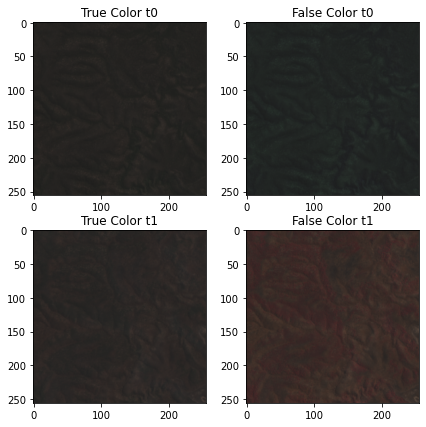

(256, 256, 8)
(256, 256, 8)
(256, 256, 4)
(256, 256, 4)


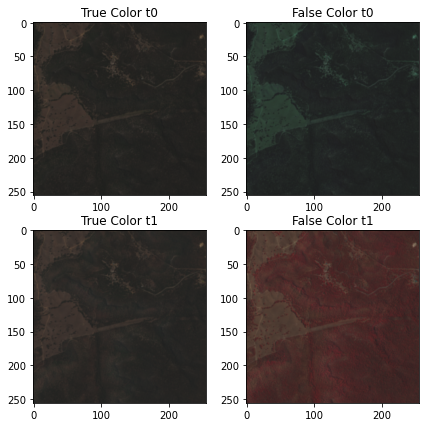

(256, 256, 8)
(256, 256, 8)
(256, 256, 4)
(256, 256, 4)


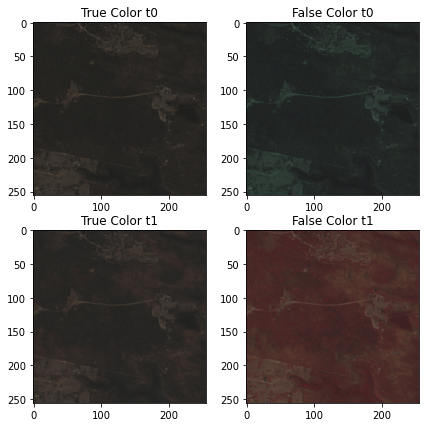

(256, 256, 8)
(256, 256, 8)
(256, 256, 4)
(256, 256, 4)


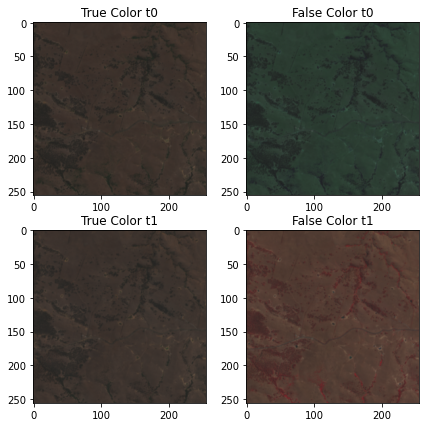

(256, 256, 8)
(256, 256, 8)
(256, 256, 4)
(256, 256, 4)


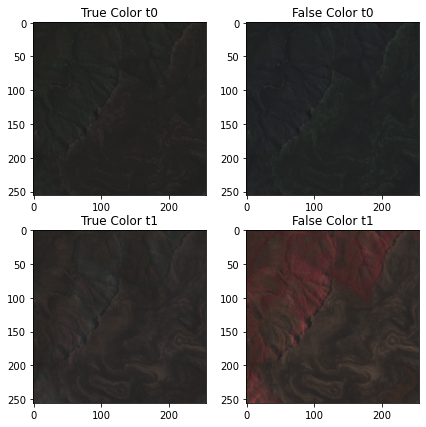

(256, 256, 8)
(256, 256, 8)
(256, 256, 4)
(256, 256, 4)


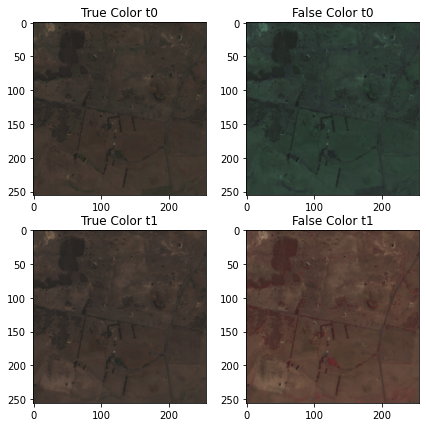

(256, 256, 8)
(256, 256, 8)
(256, 256, 4)
(256, 256, 4)


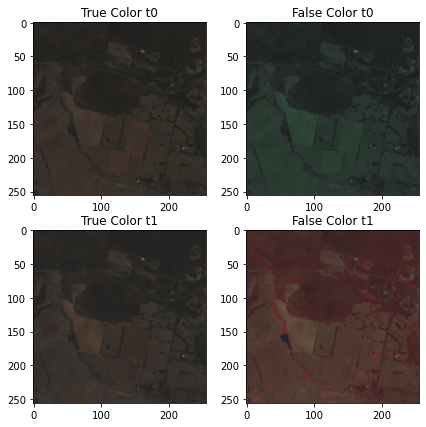

(256, 256, 8)
(256, 256, 8)
(256, 256, 4)
(256, 256, 4)


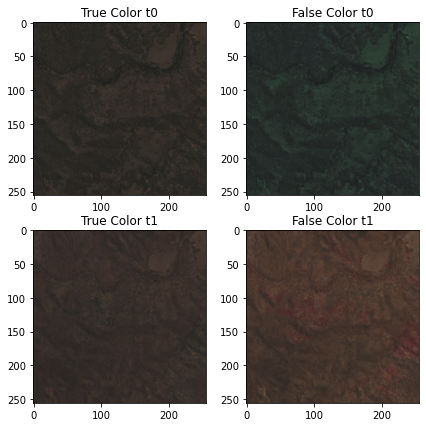

In [7]:
#Visualize raw data
for i in range(10):
    fig,ax=plt.subplots(2,2,figsize=(7,7))
    ax[0,1].set_title("False Color t0")
    ax[0,0].set_title("True Color t0")
    ax[1,1].set_title("False Color t1")
    ax[1,0].set_title("True Color t1")
    display_final_tile(data_X[i,:,:,:]+0.1,[6,4,5],ax=ax[0,1])
    display_final_tile(data_X[i,:,:,:]+0.1,[4,5,6],ax=ax[0,0])
    display_final_tile(data_y[i,:,:,:]+0.1,[3,0,1],ax=ax[1,1])
    display_final_tile(data_y[i,:,:,:]+0.1,[0,1,2],ax=ax[1,0])
    plt.show()
#display_final_tile(unrescaled_batch_label[i,:,:,:]+0.1,[0,1,2])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 8)
(256, 256, 8)
(256, 256, 4)
(256, 256, 4)


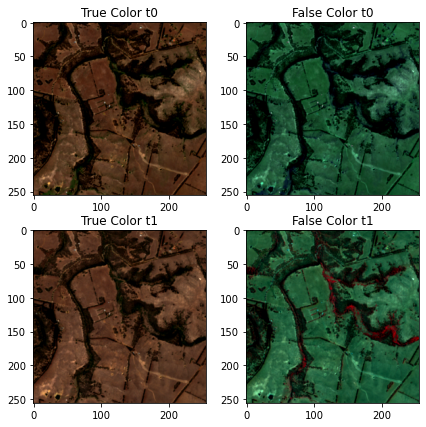

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 8)
(256, 256, 8)
(256, 256, 4)
(256, 256, 4)


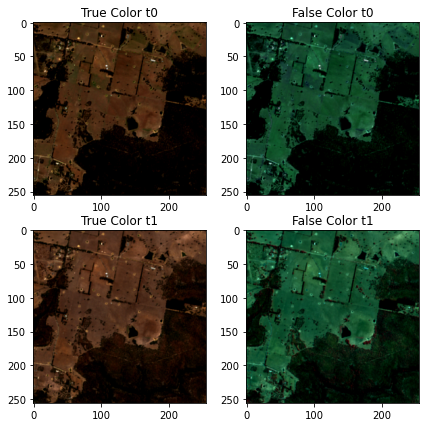

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 8)
(256, 256, 8)
(256, 256, 4)
(256, 256, 4)


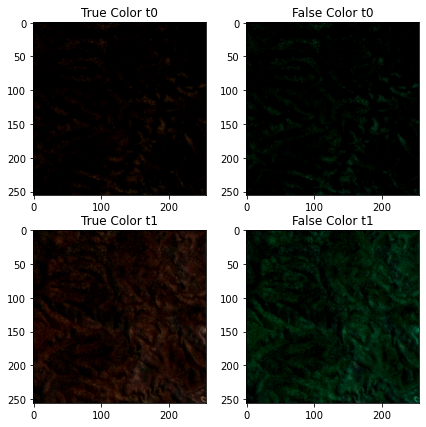

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 8)
(256, 256, 8)
(256, 256, 4)
(256, 256, 4)


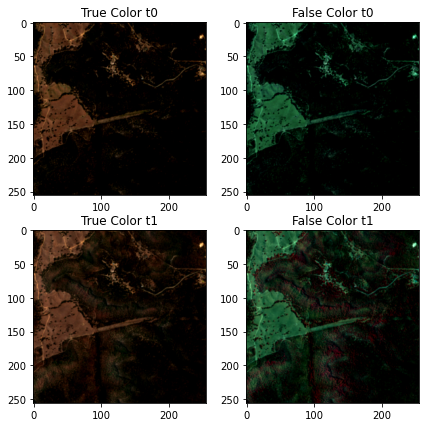

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 8)
(256, 256, 8)
(256, 256, 4)
(256, 256, 4)


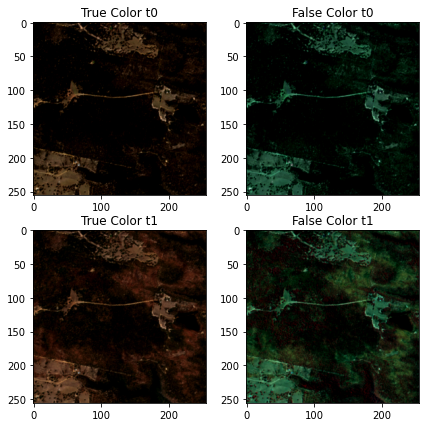

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 8)
(256, 256, 8)
(256, 256, 4)
(256, 256, 4)


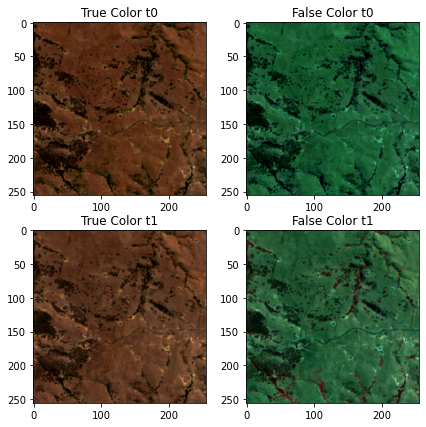

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 8)
(256, 256, 8)
(256, 256, 4)
(256, 256, 4)


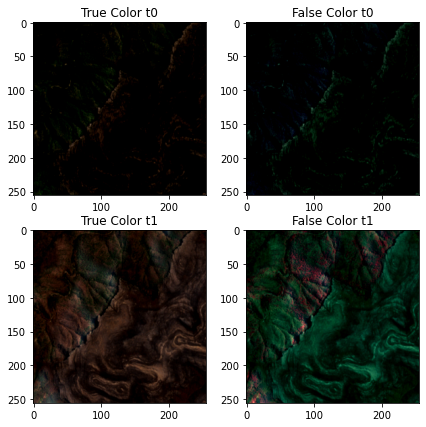

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 8)
(256, 256, 8)
(256, 256, 4)
(256, 256, 4)


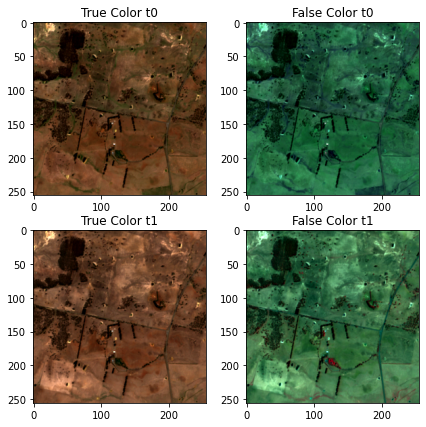

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 8)
(256, 256, 8)
(256, 256, 4)
(256, 256, 4)


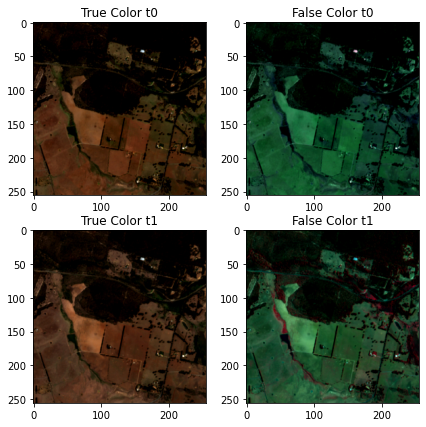

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 8)
(256, 256, 8)
(256, 256, 4)
(256, 256, 4)


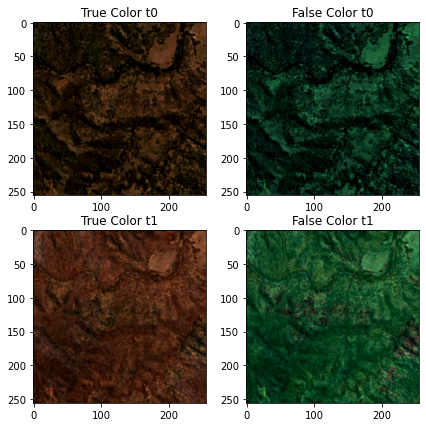

In [23]:
for i in range(10):
    fig,ax=plt.subplots(2,2,figsize=(7,7))
    ax[0,1].set_title("False Color t0")
    ax[0,0].set_title("True Color t0")
    ax[1,1].set_title("False Color t1")
    ax[1,0].set_title("True Color t1")
    display_final_tile(data_X_r[i,:,:,:]+0.1,[6,4,5],ax=ax[0,1])
    display_final_tile(data_X_r[i,:,:,:]+0.1,[4,5,6],ax=ax[0,0])
    display_final_tile(data_y_r[i,:,:,:]+0.1,[3,0,1],ax=ax[1,1])
    display_final_tile(data_y_r[i,:,:,:]+0.1,[0,1,2],ax=ax[1,0])
    plt.show()

[INFO] 40 images have been saved during the training


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


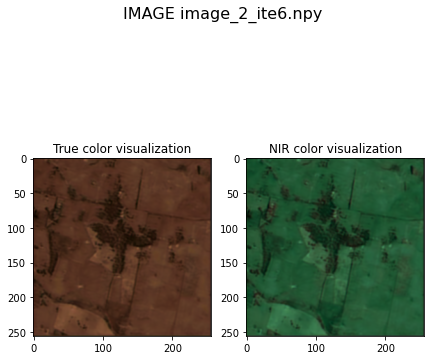

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


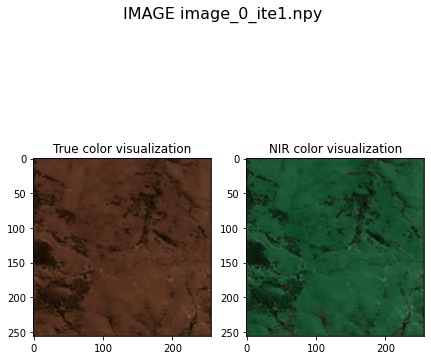

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


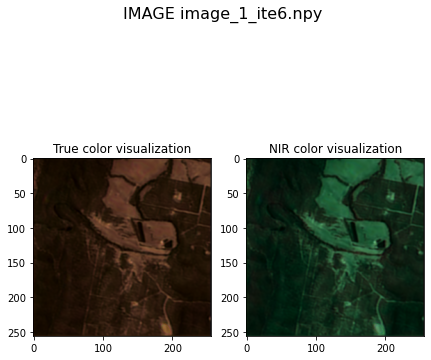

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


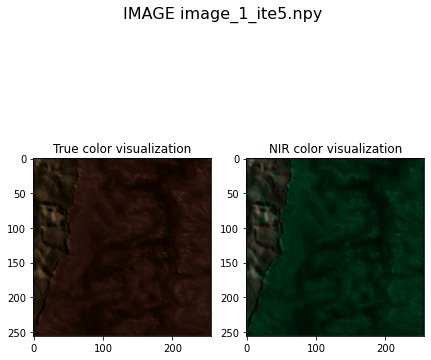

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


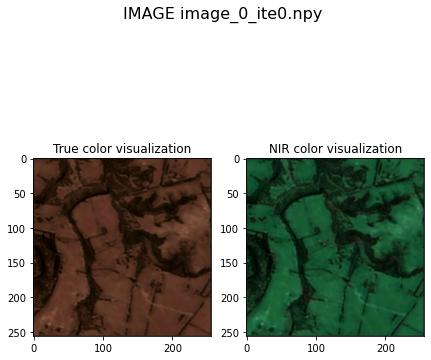

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


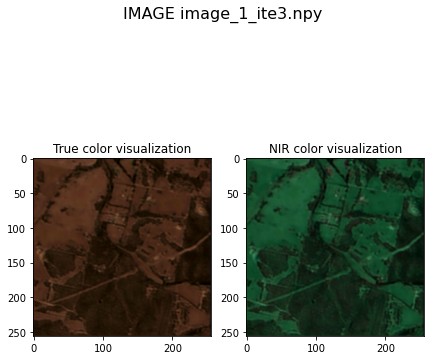

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


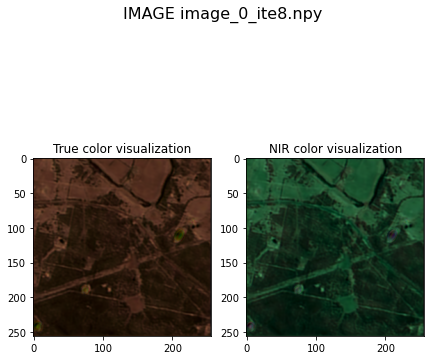

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


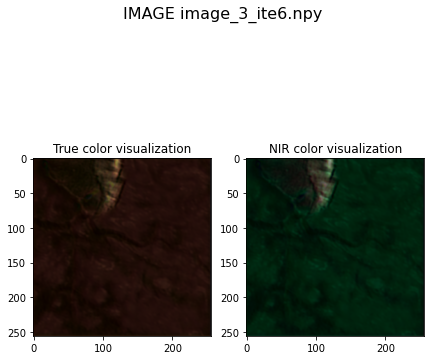

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


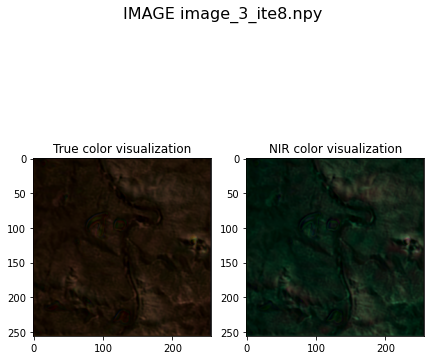

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


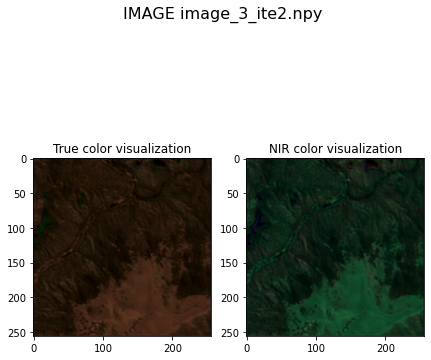

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


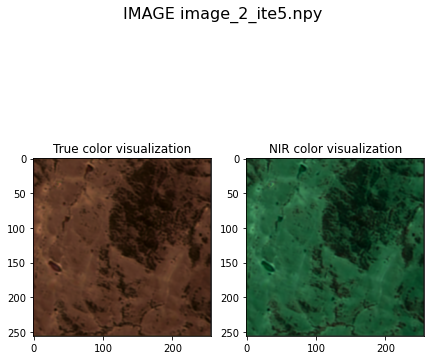

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


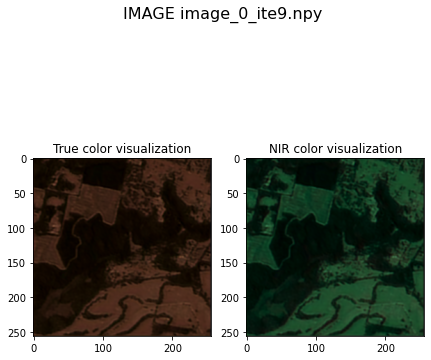

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


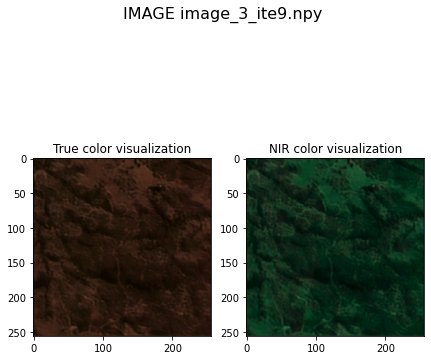

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


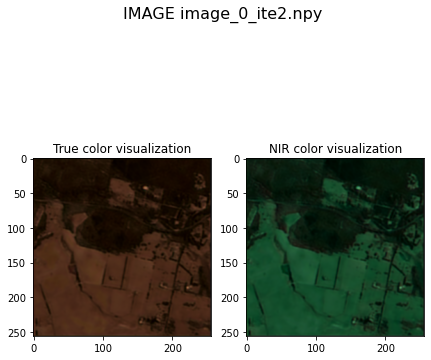

(256, 256, 4)
(256, 256, 4)


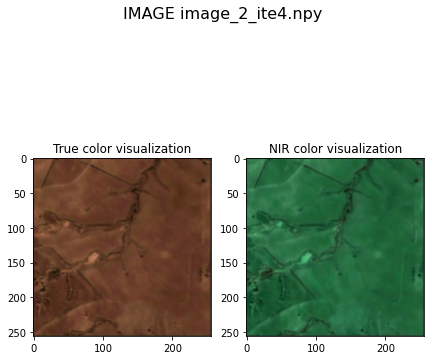

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


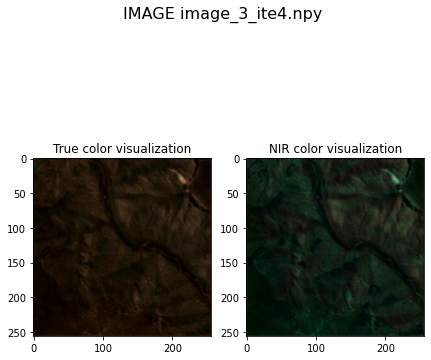

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


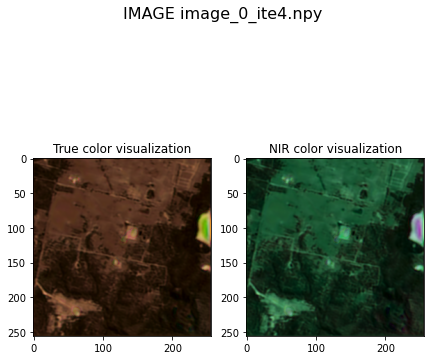

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


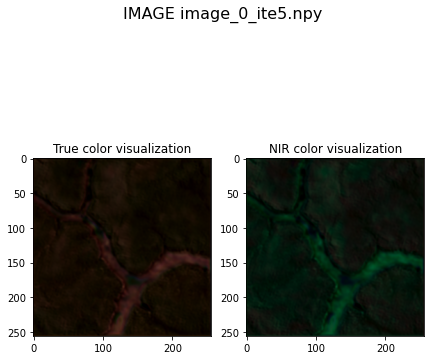

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


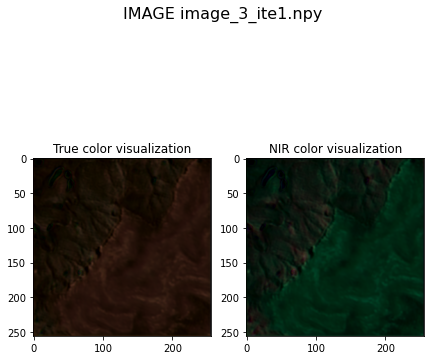

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


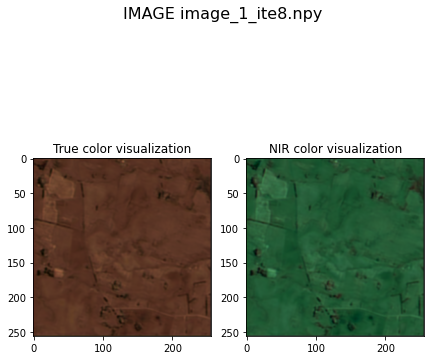

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


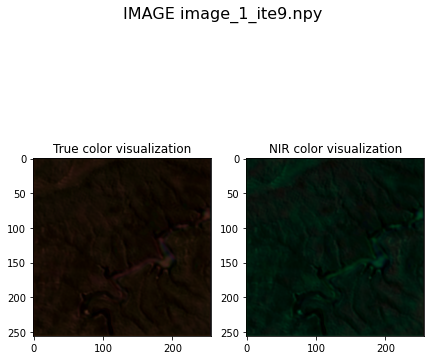

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


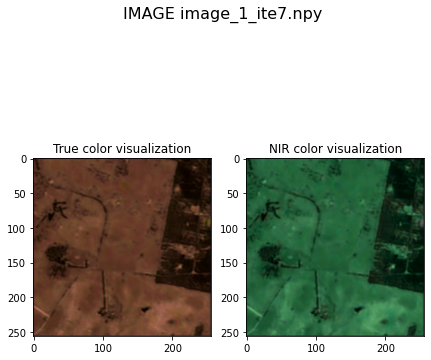

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


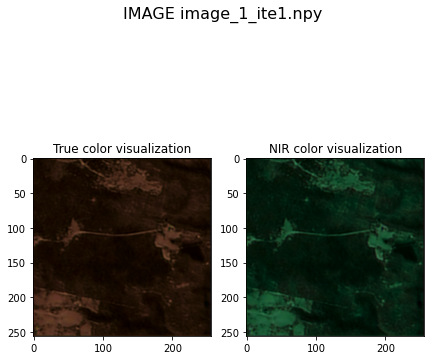

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


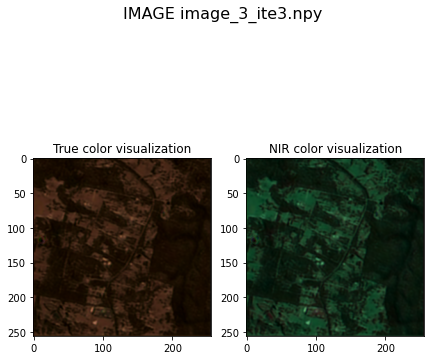

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


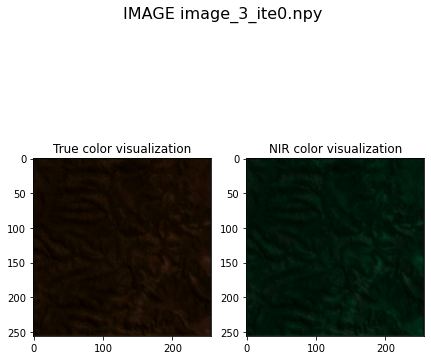

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


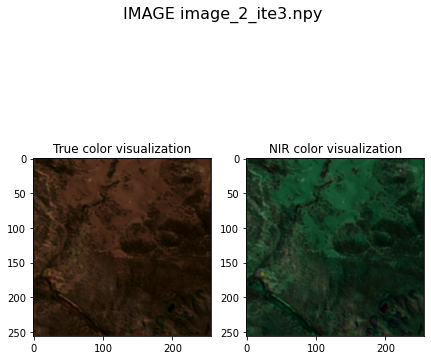

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


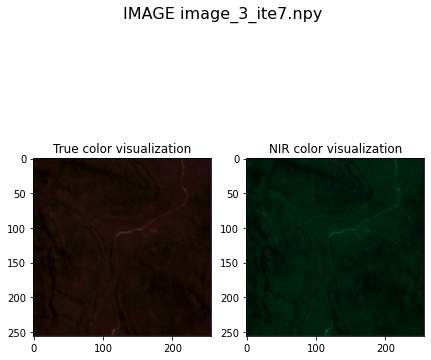

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


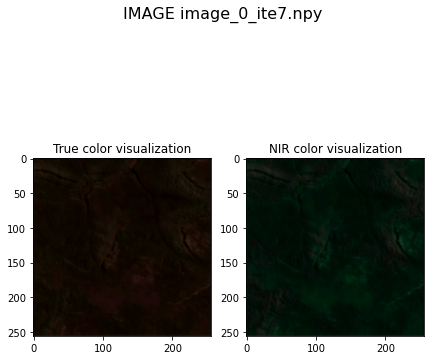

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


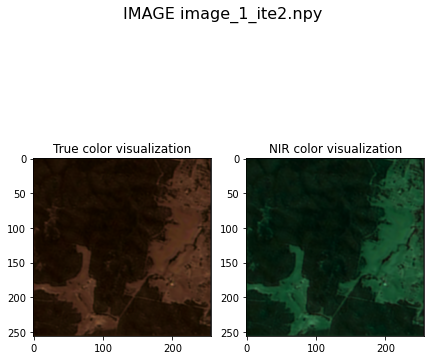

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


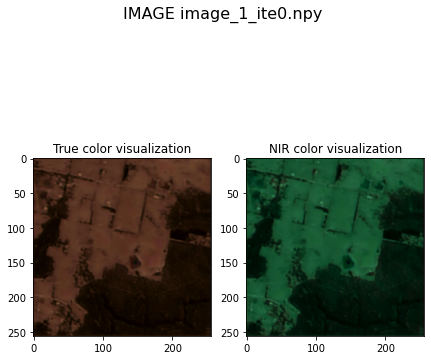

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


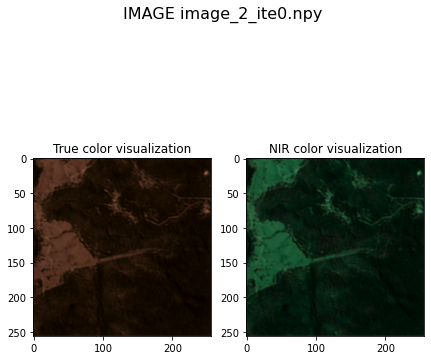

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


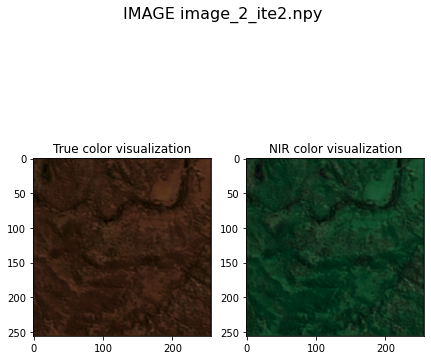

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


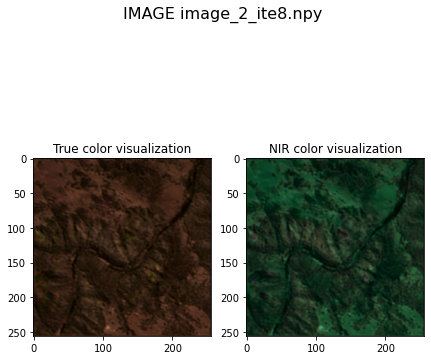

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


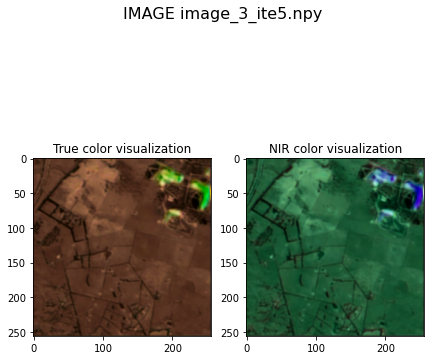

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


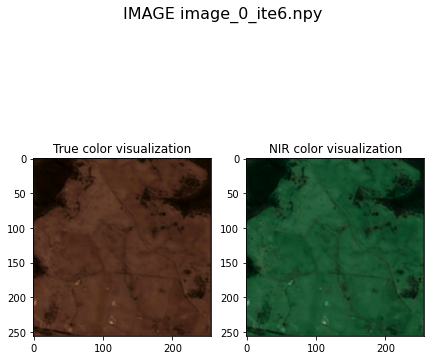

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


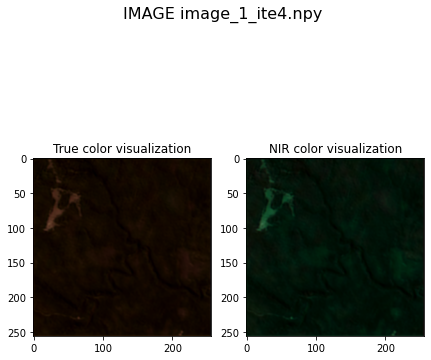

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


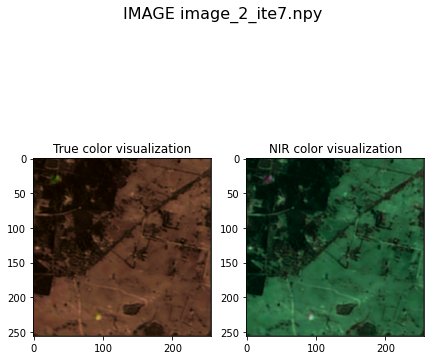

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


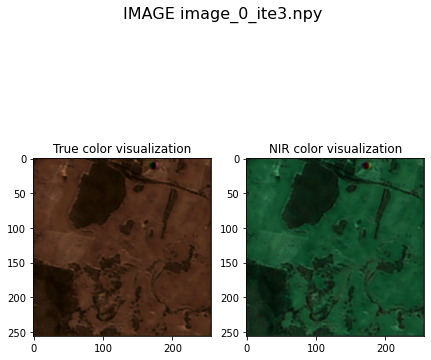

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


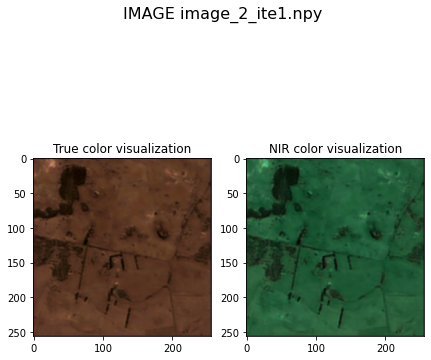

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 4)
(256, 256, 4)


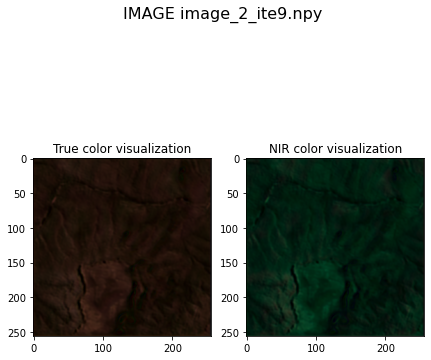

In [4]:
# The simulated images : 
l_final_tiles=find_image_indir(PATH_SAVED_IM,"npy")
max_im=len(l_final_tiles)
print("[INFO] {} images have been saved during the training".format(max_im))
for i in range(0,max_im):
    array_x=np.load(l_final_tiles[i])
    array_label=np.load(l_final_tiles[i])
    fig,ax2=plt.subplots(1,2,figsize=(7,7))
    fig.suptitle('IMAGE {}'.format(l_final_tiles[i].split("/")[-1]), fontsize=16)
    #d.plot_one_band(np.load(l_final_tiles[i])[:,:,0],fig,ax2[0,0])
    #ax2[0,0].set_title("Bande R")
    #d.plot_one_band(np.load(l_final_tiles[i])[:,:,1],fig,ax2[0,1])
    #ax2[0,1].set_title("Bande G")
    #d.plot_one_band(np.load(l_final_tiles[i])[:,:,2],fig,ax2[0,2])
    #ax2[0,2].set_title("Bande B")
    #d.plot_one_band(np.load(l_final_tiles[i])[:,:,3],fig,ax2[0,3])
    #ax2[0,3].set_title("Bande NIR")
    d.display_final_tile(np.load(l_final_tiles[i])+0.1,band=[0,1,2],ax=ax2[0])
    ax2[0].set_title("True color visualization")
    d.display_final_tile(np.load(l_final_tiles[i])+0.1,band=[3,0,1],ax=ax2[1])
    ax2[1].set_title("NIR color visualization")
    plt.show()
    

In [20]:
print(np.min(data_X_r))

-1.1678500309174327
